In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import os

# Set the root directory
root_dir = '/kaggle/input/plantvillage-dataset'

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, dirname))]

# Print the class names
for class_name in class_names:
    print(class_name)

segmented
grayscale
plantvillage dataset
color


In [3]:
from tqdm import tqdm
import cv2
import pandas as pd
import numpy as np
import os

def data(dataset_path, num_classes=38):
    images = []
    labels = []
    
    # Get the list of subfolders (class names)
    subfolders = [subfolder for subfolder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, subfolder))]
    
    # Limit the number of classes if num_classes is specified
    subfolders = subfolders[:num_classes]
    
    for subfolder in tqdm(subfolders):
        subfolder_path = os.path.join(dataset_path, subfolder)
        for image_filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_filename)
            images.append(image_path)
            labels.append(subfolder)
    
    df = pd.DataFrame({'image': images, 'label': labels})
    return df


In [4]:
segmented_path = '/kaggle/input/plantvillage-dataset/segmented'
train_segmented = data(segmented_path)
print(train_segmented.shape)
num_classes = train_segmented['label'].nunique()
print(f"Number of classes: {num_classes}")

100%|██████████| 38/38 [00:04<00:00,  7.87it/s]

(54306, 2)
Number of classes: 38


/tmp/ipykernel_23/906115831.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


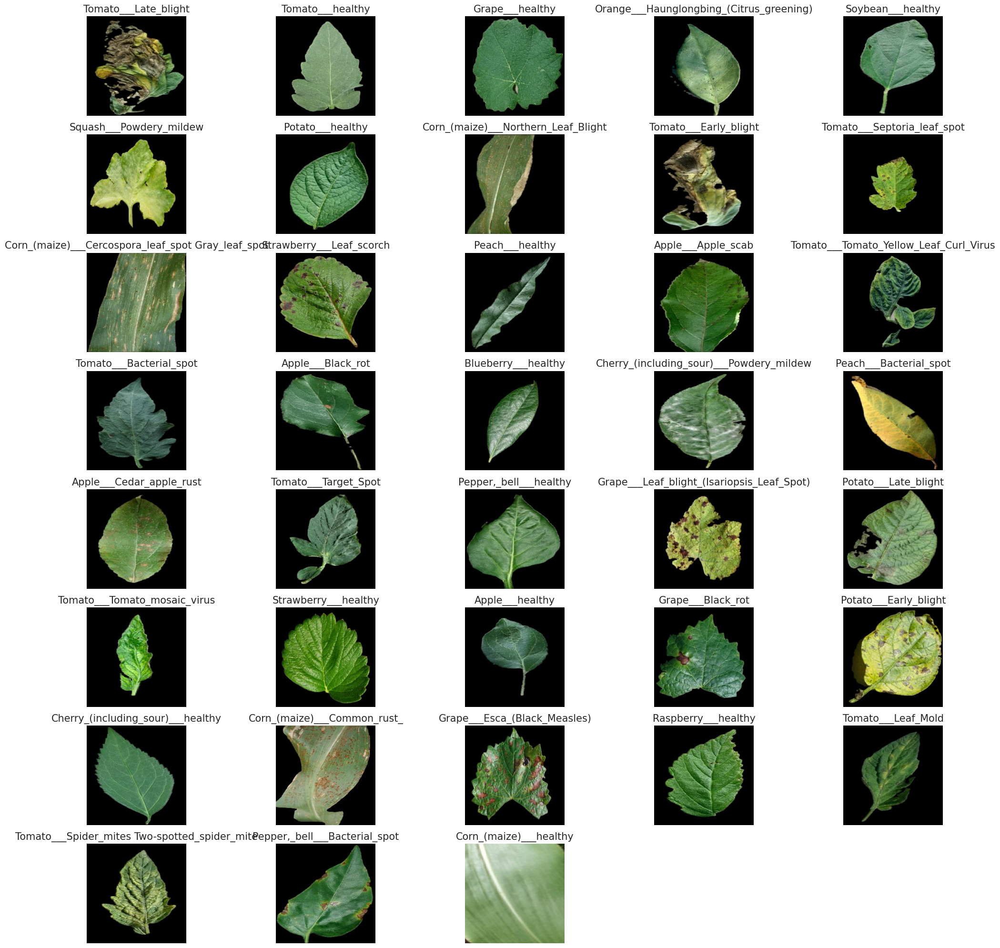

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(segmented_path) if os.path.isdir(os.path.join(segmented_path, dirname))]

# Change plot style to a lighter background with a clean design
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(segmented_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [6]:
import gc

# Delete variables
del train_segmented, segmented_path

# Run garbage collection to free memory
gc.collect()

94670

In [7]:
grayscale_path = '/kaggle/input/plantvillage-dataset/grayscale'
train_grayscale = data(grayscale_path)
print(train_grayscale.shape)
num_classes = train_grayscale['label'].nunique()
print(f"Number of classes: {num_classes}")

100%|██████████| 38/38 [00:04<00:00,  8.01it/s]

(54305, 2)
Number of classes: 38


/tmp/ipykernel_23/908144034.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


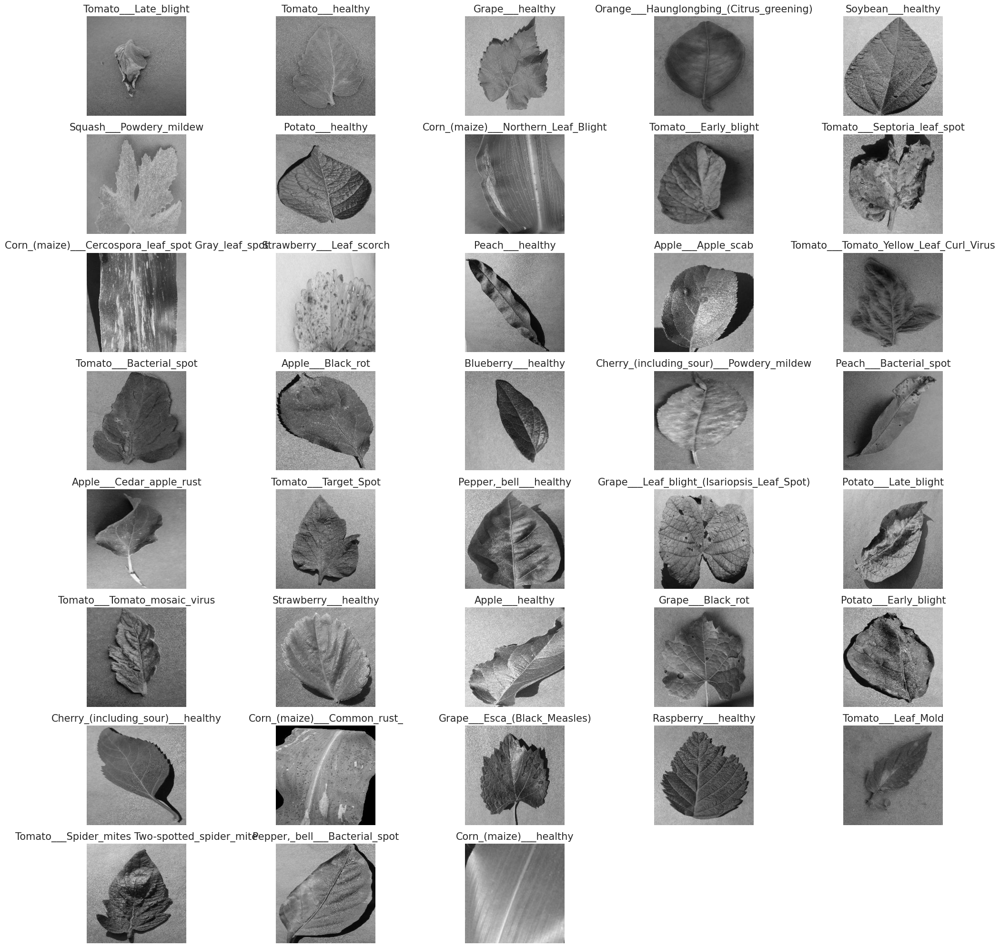

In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(grayscale_path) if os.path.isdir(os.path.join(grayscale_path, dirname))]

# Change plot style to a lighter background with a clean design
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(grayscale_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [9]:
import gc

# Delete variables
del train_grayscale, grayscale_path

# Run garbage collection to free memory
gc.collect()


95578

In [10]:
color_path = '/kaggle/input/plantvillage-dataset/color'
train_color = data(color_path)
print(train_color.shape)
num_classes = train_color['label'].nunique()
print(f"Number of classes: {num_classes}")

100%|██████████| 38/38 [00:04<00:00,  8.17it/s]

(54305, 2)
Number of classes: 38


/tmp/ipykernel_23/2366528349.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


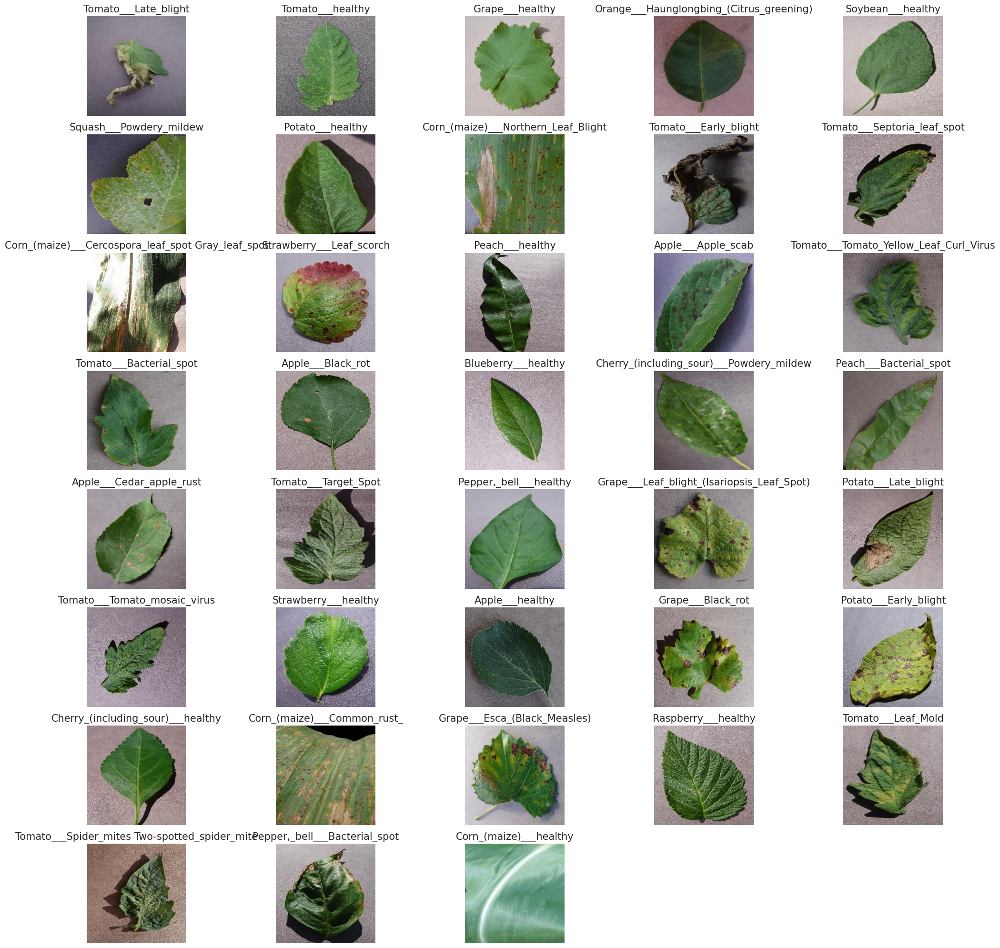

In [11]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(color_path) if os.path.isdir(os.path.join(color_path, dirname))]

plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(color_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator

X_train, X_test1, y_train, y_test1 = train_test_split(train_color['image'], train_color['label'], test_size=0.2, random_state=42,shuffle=True,stratify=train_color['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Base ImageDataGenerator for rescaling
datagen = ImageDataGenerator(rescale=1./255)

# Train ImageDataGenerator 
train_datagen = ImageDataGenerator(
    rescale=1./255
)

# Create data generators for training, testing, and validation
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)

test_generator = datagen.flow_from_dataframe(
    dataframe=df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)

val_generator = datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)


Found 43444 validated image filenames belonging to 38 classes.
Found 5431 validated image filenames belonging to 38 classes.
Found 5430 validated image filenames belonging to 38 classes.


In [14]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize

In [15]:
# Number of output classes
num_classes = 38

# Load DenseNet121 base model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Dropout layer with 50% rate
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)  # Dropout layer with 30% rate
predictions = Dense(num_classes, activation='softmax')(x)

# Build the model
model = Model(inputs=base_model.input, outputs=predictions)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [16]:
# Step 1: Freeze the layers of DenseNet121
for layer in base_model.layers:
    layer.trainable = False

# Initial learning rate
initial_lr = 1e-3

# Compile the model with AUC metric
model.compile(
    optimizer=Adam(learning_rate=initial_lr), 
    loss='categorical_crossentropy', 
    metrics=['accuracy', AUC()]
)

# Callbacks
checkpoint_cb = ModelCheckpoint("my_keras_model.keras", save_best_only=True)
early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)



reduce_lr_cb = ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1
)

In [18]:
# Initial training with frozen layers
print("Starting initial training...")
initial_epochs = 5
history = model.fit(
    train_generator,
    epochs=initial_epochs,
    validation_data=val_generator,
    callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr_cb, reduce_lr_cb]
)

Starting initial training...
Epoch 1/5


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734569785.071909      98 service.cc:145] XLA service 0x7e6c88088440 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734569785.071977      98 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734569785.071984      98 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 11:32:19 31s/step - accuracy: 0.0312 - auc: 0.4285 - loss: 4.2961

I0000 00:00:1734569801.780796      98 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 324s 216ms/step - accuracy: 0.6933 - auc: 0.9650 - loss: 1.0819 - val_accuracy: 0.9210 - val_auc: 0.9987 - val_loss: 0.2348 - learning_rate: 0.0010
Epoch 2/5
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 129s 95ms/step - accuracy: 0.8820 - auc: 0.9955 - loss: 0.3586 - val_accuracy: 0.9425 - val_auc: 0.9992 - val_loss: 0.1767 - learning_rate: 0.0010
Epoch 3/5
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 130s 95ms/step - accuracy: 0.8992 - auc: 0.9961 - loss: 0.3038 - val_accuracy: 0.9475 - val_auc: 0.9993 - val_loss: 0.1604 - learning_rate: 0.0010
Epoch 4/5
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 130s 95ms/step - accuracy: 0.9090 - auc: 0.9968 - loss: 0.2713 - val_accuracy: 0.9521 - val_auc: 0.9991 - val_loss: 0.1532 - learning_rate: 0.0010
Epoch 5/5
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9131 - auc: 0.9968 - loss: 0.2582
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 129s 95ms/step - accuracy: 0.9131 - auc: 0.9968 

In [19]:
# Step 2: Unfreeze the last 20 layers for fine-tuning
print("Unfreezing the last 20 layers for fine-tuning...")
for layer in base_model.layers[-20:]:
    layer.trainable = True

Unfreezing the last 20 layers for fine-tuning...


In [20]:
# Compile the model with a lower learning rate for fine-tuning
fine_tune_lr = 1e-5
model.compile(
    optimizer=Adam(learning_rate=fine_tune_lr),
    loss='categorical_crossentropy',
    metrics=['accuracy', AUC()]
)

# Fine-tuning
fine_tune_epochs = 20
total_epochs = initial_epochs + fine_tune_epochs
print("Starting fine-tuning...")
history_fine = model.fit(
    train_generator,
    epochs=fine_tune_epochs,
    validation_data=val_generator,
    callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr_cb]
)

Starting fine-tuning...
Epoch 1/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 181s 114ms/step - accuracy: 0.7511 - auc_1: 0.9602 - loss: 1.1093 - val_accuracy: 0.9529 - val_auc_1: 0.9987 - val_loss: 0.1534 - learning_rate: 1.0000e-05
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 134s 98ms/step - accuracy: 0.9100 - auc_1: 0.9952 - loss: 0.2946 - val_accuracy: 0.9624 - val_auc_1: 0.9989 - val_loss: 0.1213 - learning_rate: 1.0000e-05
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 133s 98ms/step - accuracy: 0.9296 - auc_1: 0.9970 - loss: 0.2204 - val_accuracy: 0.9643 - val_auc_1: 0.9991 - val_loss: 0.1104 - learning_rate: 1.0000e-05
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 133s 98ms/step - accuracy: 0.9352 - auc_1: 0.9975 - loss: 0.1980 - val_accuracy: 0.9665 - val_auc_1: 0.9993 - val_loss: 0.1015 - learning_rate: 1.0000e-05
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 133s 98ms/step - accuracy: 0.9406 - auc_1: 0.9973 - loss: 0.1862 - val_accuracy: 0.9681 - val_auc_1: 0.9994 - val_loss: 0.0951 - learning_rate: 1

In [21]:
# Combine the training history
print("Keys in history:", history.history.keys())
print("Keys in history_fine:", history_fine.history.keys())
history.history['loss'].extend(history_fine.history['loss'])
history.history['val_loss'].extend(history_fine.history['val_loss'])
history.history['accuracy'].extend(history_fine.history['accuracy'])
history.history['val_accuracy'].extend(history_fine.history['val_accuracy'])
history.history['auc'].extend(history_fine.history['auc_1'])
history.history['val_auc'].extend(history_fine.history['val_auc_1'])


Keys in history: dict_keys(['accuracy', 'auc', 'loss', 'val_accuracy', 'val_auc', 'val_loss', 'learning_rate'])
Keys in history_fine: dict_keys(['accuracy', 'auc_1', 'loss', 'val_accuracy', 'val_auc_1', 'val_loss', 'learning_rate'])


/tmp/ipykernel_23/2555567943.py:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')  # Clean and light background


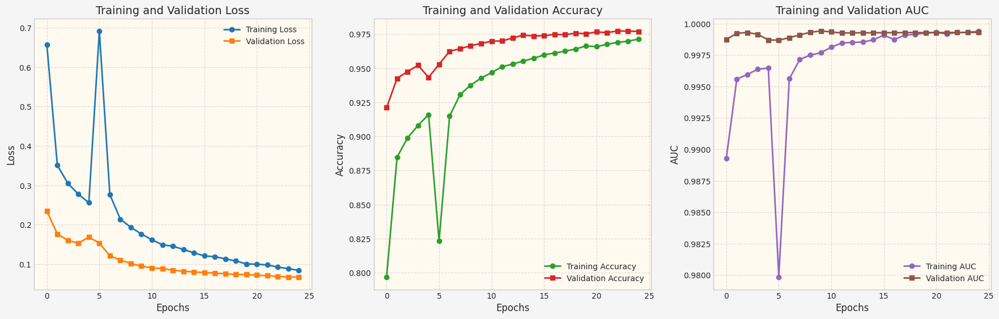

In [22]:
import matplotlib.pyplot as plt

# Set the style and figure background
plt.style.use('seaborn-whitegrid')  # Clean and light background
plt.figure(figsize=(18, 6), facecolor='whitesmoke')  # Light figure background

# Loss Curve
plt.subplot(1, 3, 1, facecolor='floralwhite')  # Subplot background
plt.plot(history.history['loss'], label='Training Loss', color='#1f77b4', linewidth=2, marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', color='#ff7f0e', linewidth=2, marker='s')
plt.title('Training and Validation Loss', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

# Accuracy Curve
plt.subplot(1, 3, 2, facecolor='floralwhite')
plt.plot(history.history['accuracy'], label='Training Accuracy', color='#2ca02c', linewidth=2, marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='#d62728', linewidth=2, marker='s')
plt.title('Training and Validation Accuracy', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

# AUC Curve
plt.subplot(1, 3, 3, facecolor='floralwhite')
plt.plot(history.history['auc'], label='Training AUC', color='#9467bd', linewidth=2, marker='o')
plt.plot(history.history['val_auc'], label='Validation AUC', color='#8c564b', linewidth=2, marker='s')
plt.title('Training and Validation AUC', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('AUC', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout and display
plt.tight_layout(pad=2.0)  # Adds padding between subplots
plt.show()


In [23]:
# Evaluate the model
test_loss, test_accuracy, test_auc = model.evaluate(test_generator, verbose=0)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Test Loss: 0.0706
Test Accuracy: 0.9779
Test AUC: 0.9992


170/170 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step


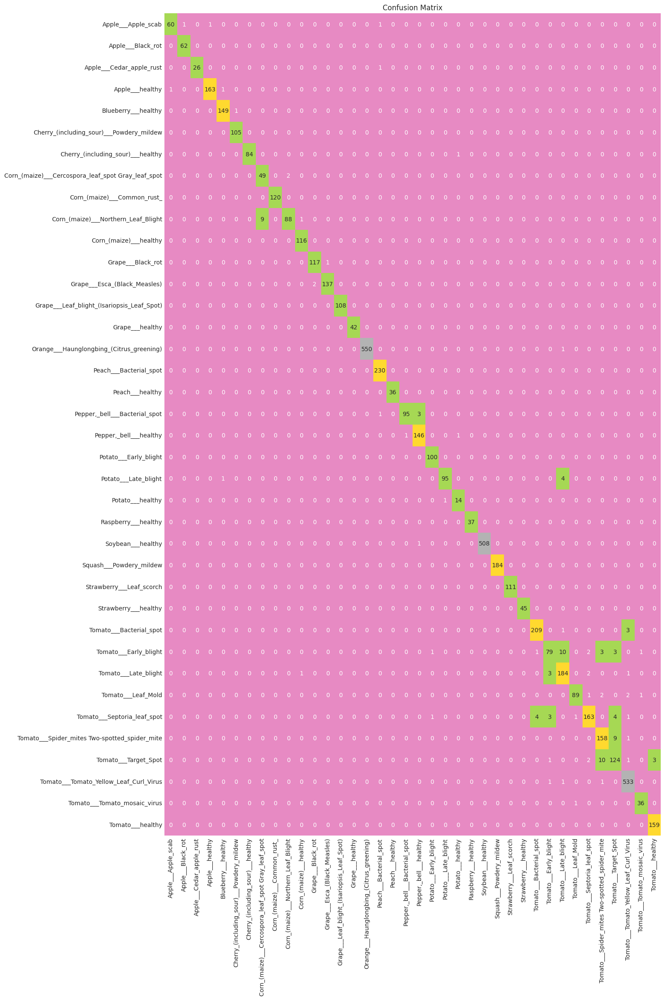

In [24]:
# Confusion Matrix and Classification Report
y_pred = np.argmax(model.predict(test_generator), axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Confusion Matrix
CM = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(15, 25))
sns.heatmap(CM, fmt='g', center=True, cbar=False, annot=True, cmap='Set2',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.show()

In [25]:
# Classification Report
classification_report_str = classification_report(y_true, y_pred, target_names=class_labels)
print('Classification Report:\n', classification_report_str)

Classification Report:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.95      0.97        63
                                 Apple___Black_rot       0.98      1.00      0.99        62
                          Apple___Cedar_apple_rust       1.00      0.96      0.98        27
                                   Apple___healthy       0.99      0.99      0.99       165
                               Blueberry___healthy       0.99      0.99      0.99       150
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      1.00       105
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99        85
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.84      0.96      0.90        51
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       120
               Corn_(maize)___Northern_Leaf_Blight     